In [15]:
#from importlib.resources import path
import os
import torch
import clip
import numpy as np
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from tqdm import tqdm
import pandas as pd
import time
from PIL import Image
from PIL import ImageFile  # 大きな画像もロード
import pickle
import cv2
import json
import matplotlib.pyplot as plt
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [16]:

def calc_similarity(x, y):
    batch_size = len(x)
    gt_size = len(y)

    similarity = torch.empty(batch_size, gt_size).to('cuda')
    for i in range(batch_size):
        for j in range(gt_size):
            similarity[i, j] = (x[i] @ y[j]) / max((x[i].norm() * y[j].norm()), 1e-8)
    return similarity.cpu().numpy()

start getting image file name list
end getting image file name list
/storage/dataset/ECoG/internal/GODv2-4/images_val/n02951358_23759.JPEG
0th Label instrument
 probs: [[0.2847 0.7153]] sims [[0.19799805 0.20715332]]


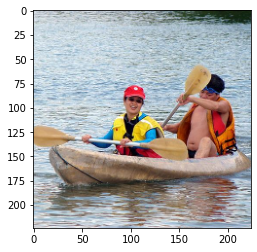

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03452741_24622.JPEG
1th Label instrument
 probs: [[8.297e-04 9.990e-01]] sims [[0.203125   0.27416992]]


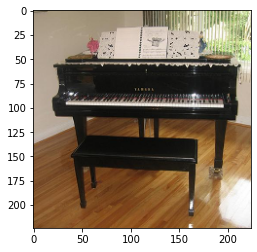

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02882301_14188.JPEG
2th Label instrument
 probs: [[0.3452 0.655 ]] sims [[0.18701172 0.19372559]]


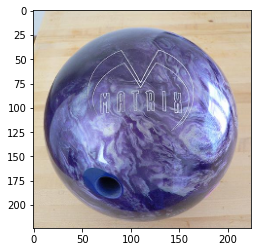

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02274259_24319.JPEG
3th Label animal
 probs: [[0.9897  0.01033]] sims [[0.2388916  0.19335938]]


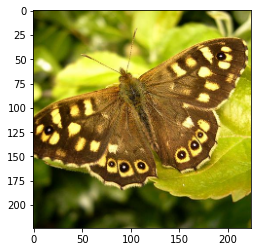

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03626115_19498.JPEG
4th Label instrument
 probs: [[0.01187 0.9883 ]] sims [[0.20666504 0.25097656]]


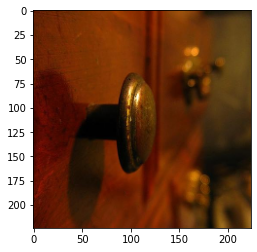

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04297750_25624.JPEG
5th Label instrument
 probs: [[0.01567 0.9844 ]] sims [[0.19702148 0.23852539]]


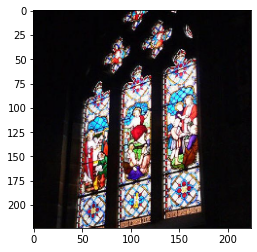

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02190790_15121.JPEG
6th Label animal
 probs: [[0.99    0.00956]] sims [[0.23339844 0.18701172]]


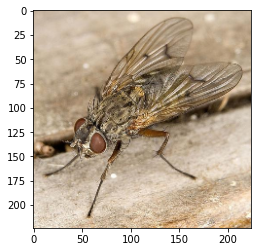

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02437971_5013.JPEG
7th Label animal
 probs: [[9.995e-01 5.274e-04]] sims [[0.2685547  0.19311523]]


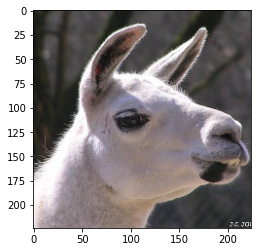

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03064758_38750.JPEG
8th Label instrument
 probs: [[0.04742 0.9526 ]] sims [[0.18591309 0.21594238]]


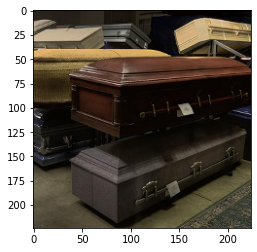

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03237416_58334.JPEG
9th Label instrument
 probs: [[0.1688 0.831 ]] sims [[0.1986084  0.21472168]]


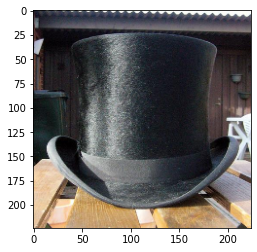

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03455488_28622.JPEG
10th Label instrument
 probs: [[0.22 0.78]] sims [[0.18188477 0.19445801]]


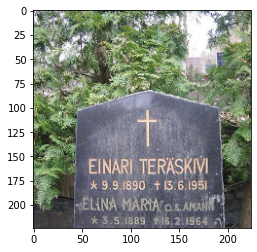

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04252077_10859.JPEG
11th Label instrument
 probs: [[0.1646 0.8354]] sims [[0.18933105 0.20568848]]


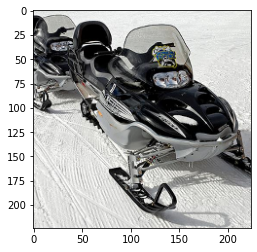

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01858441_11077.JPEG
12th Label animal
 probs: [[0.9917  0.00819]] sims [[0.26367188 0.21569824]]


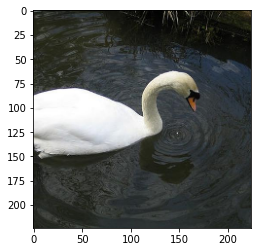

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02437136_12836.JPEG
13th Label animal
 probs: [[0.9604  0.03964]] sims [[0.2331543  0.20117188]]


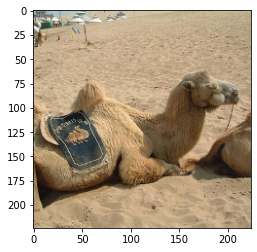

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02690373_7713.JPEG
14th Label instrument
 probs: [[0.3557 0.644 ]] sims [[0.21130371 0.21740723]]


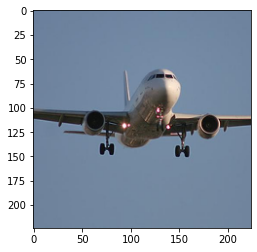

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02824058_18729.JPEG
15th Label instrument
 probs: [[0.3486 0.6514]] sims [[0.20263672 0.2088623 ]]


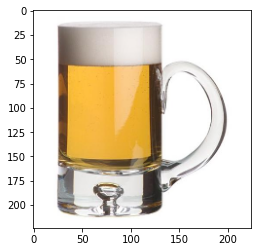

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02916179_24850.JPEG
16th Label instrument
 probs: [[0.1733 0.8267]] sims [[0.19091797 0.20666504]]


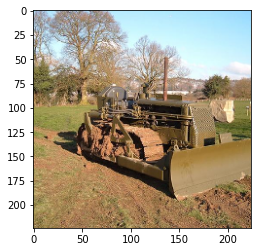

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03122295_31279.JPEG
17th Label instrument
 probs: [[0.4766 0.5234]] sims [[0.20715332 0.20825195]]


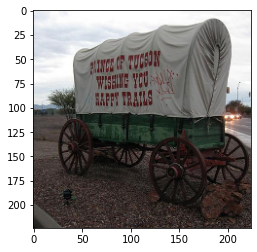

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03124170_13920.JPEG
18th Label animal
 probs: [[0.8843  0.11597]] sims [[0.23425293 0.21398926]]


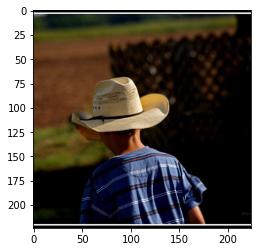

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03272010_11001.JPEG
19th Label instrument
 probs: [[0.02635 0.9736 ]] sims [[0.21923828 0.25561523]]


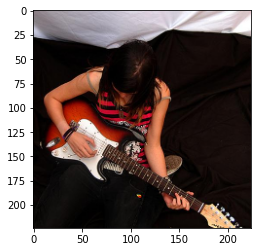

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03345837_12501.JPEG
20th Label instrument
 probs: [[0.1294 0.8706]] sims [[0.20117188 0.22045898]]


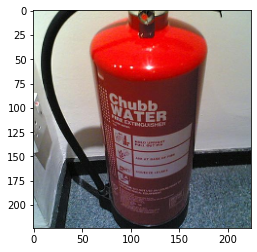

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03379051_8496.JPEG
21th Label animal
 probs: [[0.6826 0.3174]] sims [[0.18640137 0.17895508]]


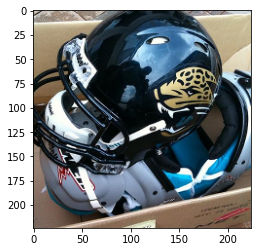

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03482252_22530.JPEG
22th Label instrument
 probs: [[0.4111 0.589 ]] sims [[0.20153809 0.20532227]]


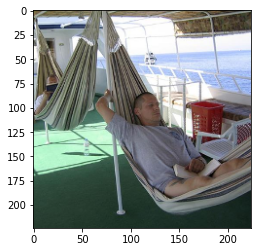

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03716966_28524.JPEG
23th Label instrument
 probs: [[5.035e-04 9.995e-01]] sims [[0.21435547 0.2902832 ]]


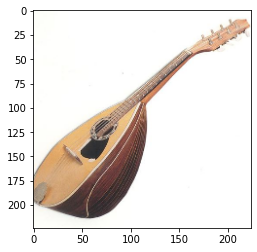

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03761084_43533.JPEG
24th Label instrument
 probs: [[0.1442 0.856 ]] sims [[0.17956543 0.19750977]]


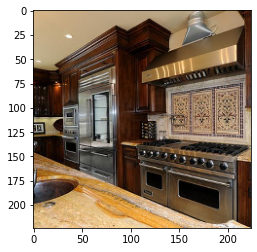

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03767745_109.JPEG
25th Label instrument
 probs: [[0.1225 0.8774]] sims [[0.19482422 0.21459961]]


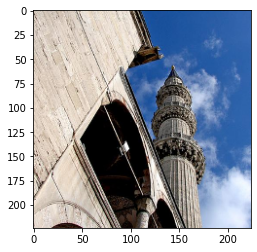

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03954393_10038.JPEG
26th Label instrument
 probs: [[0.01243 0.988  ]] sims [[0.18518066 0.22924805]]


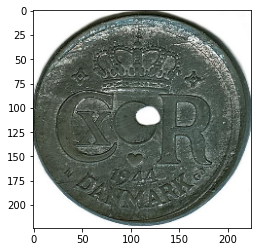

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04210120_9062.JPEG
27th Label instrument
 probs: [[0.0927 0.907 ]] sims [[0.22875977 0.25170898]]


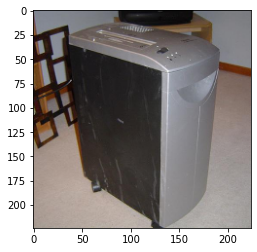

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04254777_16338.JPEG
28th Label instrument
 probs: [[0.4187 0.5815]] sims [[0.19018555 0.19360352]]


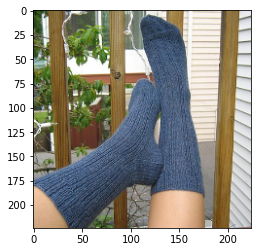

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04533802_19479.JPEG
29th Label instrument
 probs: [[0.0601 0.94  ]] sims [[0.20483398 0.23254395]]


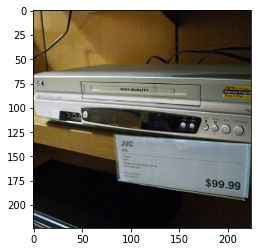

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04554684_53399.JPEG
30th Label instrument
 probs: [[0.1733 0.8267]] sims [[0.19702148 0.21252441]]


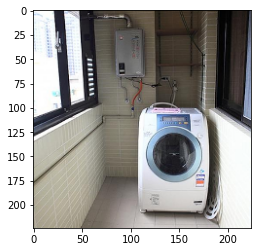

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04572121_3262.JPEG
31th Label instrument
 probs: [[0.02844 0.9717 ]] sims [[0.1895752  0.22497559]]


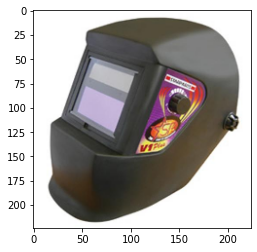

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01621127_19020.JPEG
32th Label animal
 probs: [[0.999    0.001081]] sims [[0.26416016 0.19592285]]


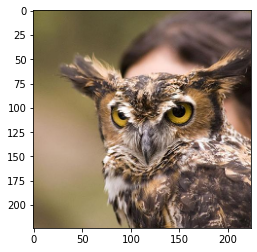

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01677366_18182.JPEG
33th Label animal
 probs: [[0.9976   0.002434]] sims [[0.25805664 0.19787598]]


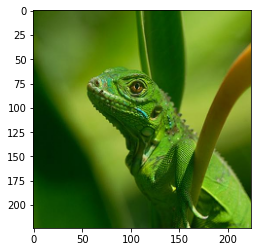

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01943899_24131.JPEG
34th Label instrument
 probs: [[0.381  0.6187]] sims [[0.20947266 0.21435547]]


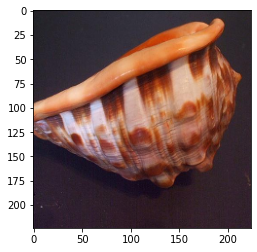

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01976957_13223.JPEG
35th Label animal
 probs: [[0.9873   0.012825]] sims [[0.25463867 0.21118164]]


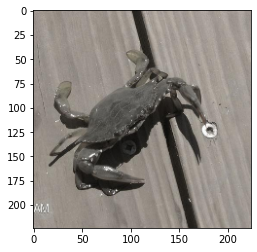

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02071294_46212.JPEG
36th Label animal
 probs: [[9.99e-01 9.40e-04]] sims [[0.26123047 0.19152832]]


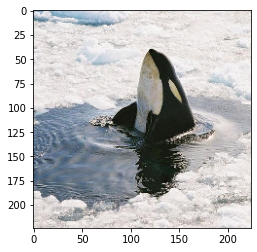

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02128385_20264.JPEG
37th Label animal
 probs: [[1.000e+00 1.215e-04]] sims [[0.2758789  0.18579102]]


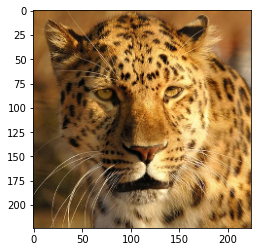

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02139199_10398.JPEG
38th Label animal
 probs: [[0.9756  0.02443]] sims [[0.2512207  0.21459961]]


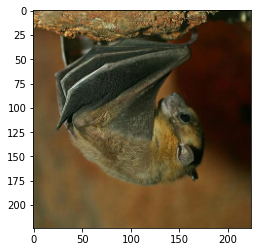

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02416519_12793.JPEG
39th Label animal
 probs: [[0.999    0.001081]] sims [[0.24523926 0.17687988]]


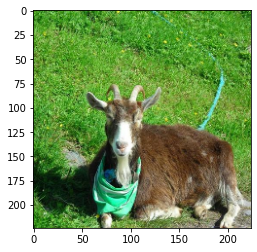

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02797295_15411.JPEG
40th Label instrument
 probs: [[0.0511 0.9487]] sims [[0.23034668 0.25976562]]


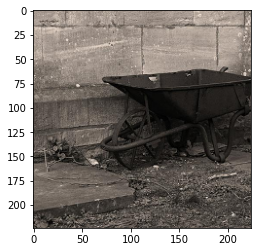

/storage/dataset/ECoG/internal/GODv2-4/images_val/n02950256_22949.JPEG
41th Label instrument
 probs: [[0.03622 0.964  ]] sims [[0.20373535 0.23669434]]


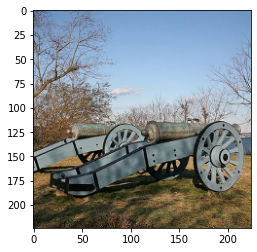

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03495258_9895.JPEG
42th Label instrument
 probs: [[5.703e-04 9.995e-01]] sims [[0.19494629 0.2697754 ]]


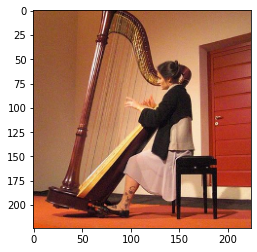

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03584254_5040.JPEG
43th Label instrument
 probs: [[0.06464 0.9355 ]] sims [[0.19348145 0.22033691]]


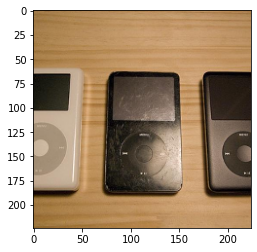

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03710193_22225.JPEG
44th Label animal
 probs: [[0.734  0.2659]] sims [[0.20471191 0.19470215]]


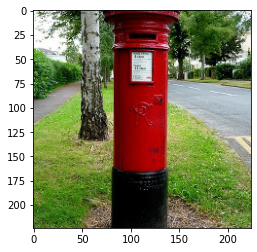

/storage/dataset/ECoG/internal/GODv2-4/images_val/n03941684_21672.JPEG
45th Label instrument
 probs: [[0.00669 0.993  ]] sims [[0.19641113 0.24645996]]


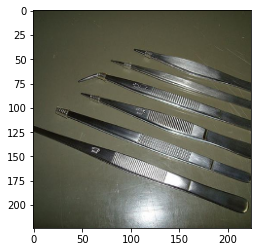

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04387400_16693.JPEG
46th Label instrument
 probs: [[0.002083 0.998   ]] sims [[0.17871094 0.24060059]]


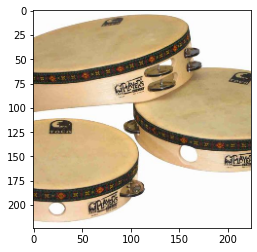

/storage/dataset/ECoG/internal/GODv2-4/images_val/n04507155_21299.JPEG
47th Label instrument
 probs: [[0.3381 0.662 ]] sims [[0.1928711  0.19946289]]


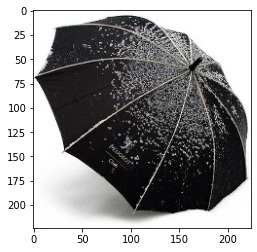

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01443537_22563.JPEG
48th Label animal
 probs: [[0.993    0.006905]] sims [[0.23693848 0.18725586]]


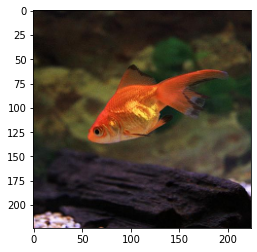

/storage/dataset/ECoG/internal/GODv2-4/images_val/n01846331_17038.JPEG
49th Label animal
 probs: [[0.9976   0.002672]] sims [[0.2409668  0.18164062]]


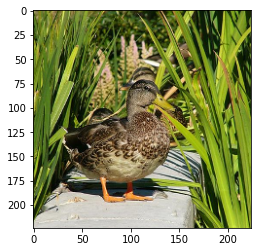

In [46]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model = model.eval()


prompt_root = '/home/yainoue/meg2image/codes/MEG-decoding/data'
prompt_sub_dir = 'prompt2'
prompt_dir = os.path.join(prompt_root, prompt_sub_dir)
prompt_dict_file = os.path.join(prompt_dir, 'classification1.json')
with open(prompt_dict_file, 'r') as f:
    prompt_dict = json.load(f)

prompts = []
prefix = prompt_dict['prefix']
for i, t in prompt_dict.items():
    if i == 'prefix':
        continue
    prompts.append(t+'\n')
text = clip.tokenize([prefix + s.replace('\n','') for s in prompts]).to(device)
with torch.no_grad():
    text_features = model.encode_text(text)


images_dir = "/storage/dataset/ECoG/internal/GODv2-4/images_val/"
print('start getting image file name list')
list_images = os.listdir(images_dir)
print('end getting image file name list')
len(list_images)

image_names_list = []
image_feats_list = []

for cnt, img in enumerate(list_images):
    img_dir = images_dir + img
    image = preprocess(Image.open(img_dir)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image)
        logits_per_image, logits_per_text = model(image, text)
        probs = logits_per_image.softmax(dim=-1).cpu().numpy()

    
    sims = calc_similarity(image_features, text_features)

    
    image_feats_list.append(image_features)
    image_names_list.append(img)
    
    label = prompts[np.argmax(probs)]
    print(img_dir)
    # print(f"{cnt}th Label {label} probs:", probs, 'logits', logits_per_image)
    print(f"{cnt}th Label {label} probs:", probs, 'sims', sims)
    
    label = prompts[np.argmax(probs)]
#     print(img_dir)
#     print(f"{cnt}th Label {label} probs:", probs, 'logits', logits_per_image)
    img = cv2.imread(img_dir)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))
    plt.imshow(img)
    plt.show()
    

In [47]:
[image_features.sum() for image_features in image_feats_list]

[tensor(-4.4258, device='cuda:0', dtype=torch.float16),
 tensor(23.5000, device='cuda:0', dtype=torch.float16),
 tensor(-9.2109, device='cuda:0', dtype=torch.float16),
 tensor(-7.6289, device='cuda:0', dtype=torch.float16),
 tensor(-0.8691, device='cuda:0', dtype=torch.float16),
 tensor(-2.0332, device='cuda:0', dtype=torch.float16),
 tensor(-6.3984, device='cuda:0', dtype=torch.float16),
 tensor(4.8320, device='cuda:0', dtype=torch.float16),
 tensor(-2.2188, device='cuda:0', dtype=torch.float16),
 tensor(-3.0312, device='cuda:0', dtype=torch.float16),
 tensor(3.4258, device='cuda:0', dtype=torch.float16),
 tensor(-6.3633, device='cuda:0', dtype=torch.float16),
 tensor(4.5000, device='cuda:0', dtype=torch.float16),
 tensor(0.8257, device='cuda:0', dtype=torch.float16),
 tensor(3.9141, device='cuda:0', dtype=torch.float16),
 tensor(-6.6367, device='cuda:0', dtype=torch.float16),
 tensor(-7.9141, device='cuda:0', dtype=torch.float16),
 tensor(-8.5703, device='cuda:0', dtype=torch.float16

In [48]:
aa = torch.cat(image_feats_list)
print(aa.mean())
print(aa.std())

tensor(0.0004, device='cuda:0', dtype=torch.float16)
tensor(0.4658, device='cuda:0', dtype=torch.float16)


In [49]:
np.any(np.isclose(aa.sum(-1).cpu().numpy(), 2.1587145))

False

In [52]:
aa.sum(-1)

tensor([ -4.4258,  23.5000,  -9.2109,  -7.6289,  -0.8691,  -2.0332,  -6.3984,
          4.8320,  -2.2188,  -3.0312,   3.4258,  -6.3633,   4.5000,   0.8257,
          3.9141,  -6.6367,  -7.9141,  -8.5703, -11.8359,  -3.1074,  10.0000,
          0.3650,  -1.4824,   1.1895,  11.1719,  -0.2646,   0.3455,   7.6250,
         10.7109,   3.2598,  11.5234,  -2.3359, -17.3125,  -8.2422,   8.5938,
          4.0195,   6.2734,  -9.6094,  -0.7949,   4.2109,  -4.1992,  -9.3281,
          2.1777,  12.8672,   8.0000,  -3.4707,  -0.1826,   5.1055,   1.6543,
         -1.5732], device='cuda:0', dtype=torch.float16)

In [55]:
bb = np.array([  2.1587145 ,  11.5320835 ,  -2.3063822 ,  -4.1928945 ,
         3.4095626 ,   6.2829194 ,  -1.9470714 ,  -8.239653  ,
        -7.6424327 ,  12.882309  ,   4.22084   ,   0.36798587,
        -9.204639  ,   4.5725517 ,   8.027873  ,  -0.16878474,
        -7.9926434 ,  -3.142738  ,   8.561369  ,   0.8665339 ,
        -0.87692595,  -9.614432  ,  -9.314001  ,   4.0280876 ,
        -3.4670465 ,   1.6670622 ,   5.172199  ,  -1.4541489 ,
         3.892178  ,   7.632568  ,   0.34187186,  -0.2403594 ,
        11.201734  ,  -6.645353  ,  -6.3460207 ,   1.1396886 ,
       -17.294989  ,  10.67174   ,   4.836171  ,  -6.391346  ,
         9.998313  ,  -2.2251205 ,  -8.593308  , -11.809484  ,
        -3.04385   ,  -1.5635682 ,  -0.7657164 ,  -4.4436426 ,
        23.54301   ,   3.2274127 ], dtype=np.float32)

In [58]:
print(aa.sum(-1).max())
print(bb.max())
print(aa.sum(-1).min())
print(bb.min())

tensor(23.5000, device='cuda:0', dtype=torch.float16)
23.54301
tensor(-17.3125, device='cuda:0', dtype=torch.float16)
-17.294989


In [65]:
orders = []
for i, b in enumerate(bb):
    print('label {i} ', torch.argmin(torch.abs(aa.sum(-1)-b)))
    orders.append(torch.argmin(torch.abs(aa.sum(-1)-b)).item())
orders

label {i}  tensor(42, device='cuda:0')
label {i}  tensor(30, device='cuda:0')
label {i}  tensor(31, device='cuda:0')
label {i}  tensor(40, device='cuda:0')
label {i}  tensor(10, device='cuda:0')
label {i}  tensor(36, device='cuda:0')
label {i}  tensor(5, device='cuda:0')
label {i}  tensor(33, device='cuda:0')
label {i}  tensor(3, device='cuda:0')
label {i}  tensor(43, device='cuda:0')
label {i}  tensor(39, device='cuda:0')
label {i}  tensor(21, device='cuda:0')
label {i}  tensor(2, device='cuda:0')
label {i}  tensor(12, device='cuda:0')
label {i}  tensor(44, device='cuda:0')
label {i}  tensor(46, device='cuda:0')
label {i}  tensor(16, device='cuda:0')
label {i}  tensor(19, device='cuda:0')
label {i}  tensor(34, device='cuda:0')
label {i}  tensor(13, device='cuda:0')
label {i}  tensor(4, device='cuda:0')
label {i}  tensor(37, device='cuda:0')
label {i}  tensor(41, device='cuda:0')
label {i}  tensor(35, device='cuda:0')
label {i}  tensor(45, device='cuda:0')
label {i}  tensor(48, device=

[42,
 30,
 31,
 40,
 10,
 36,
 5,
 33,
 3,
 43,
 39,
 21,
 2,
 12,
 44,
 46,
 16,
 19,
 34,
 13,
 4,
 37,
 41,
 35,
 45,
 48,
 47,
 22,
 14,
 27,
 26,
 25,
 24,
 15,
 11,
 23,
 32,
 28,
 7,
 6,
 20,
 8,
 17,
 18,
 9,
 49,
 38,
 0,
 1,
 29]

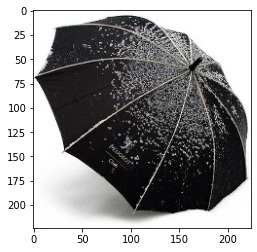

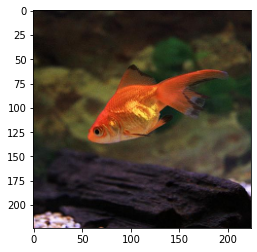

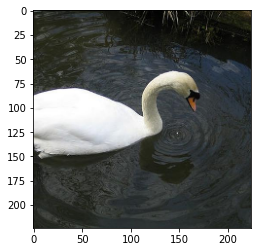

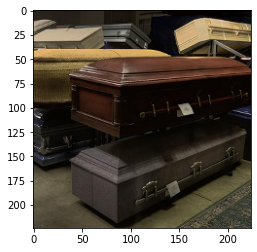

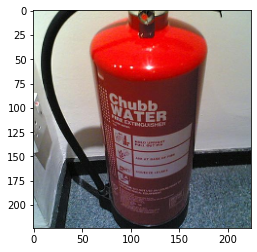

...

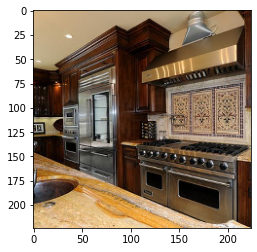

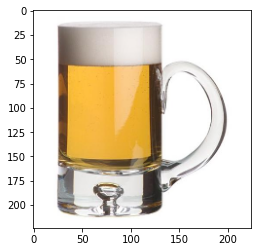

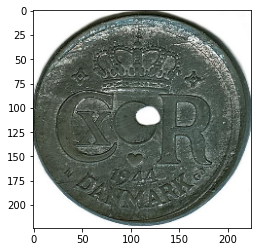

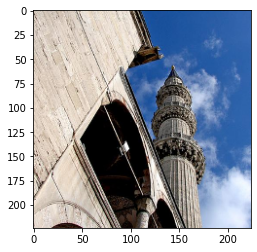

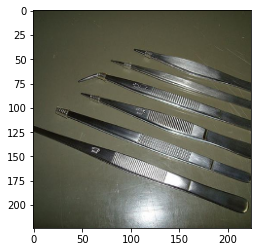

In [66]:

for cnt, i in enumerate(np.argsort(orders)):
    img = list_images[i]
    img_dir = images_dir + img
    img = cv2.imread(img_dir)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))
    plt.imshow(img)
    plt.show()
    

    

In [59]:
aa[1]

tensor([ 4.7290e-01,  2.1155e-01,  2.1753e-01,  2.6474e-02,  2.1521e-01,
         6.0455e-02,  4.6924e-01, -9.4910e-02,  2.1985e-01, -5.6580e-02,
        -1.5295e-01, -1.0736e-01, -9.7809e-03, -2.2937e-01,  4.9805e-01,
        -3.0859e-01,  6.5857e-02,  5.0830e-01, -8.5571e-02, -5.7617e-01,
        -1.9608e-02,  2.2644e-01, -1.3626e-02, -1.0089e-01,  1.4969e-02,
         8.7341e-02, -6.3721e-02, -2.1838e-01,  2.9370e-01,  2.5131e-02,
         1.3062e-01,  2.9224e-01, -4.6411e-01,  5.7465e-02, -5.7953e-02,
         1.6586e-02,  5.0812e-02, -2.8418e-01,  1.0638e-01,  4.1821e-01,
        -2.7856e-01, -1.2634e-01,  2.2229e-01, -1.9373e-01, -1.6006e-02,
        -1.0889e+00,  3.2373e-01,  3.3008e-01, -5.1416e-01,  1.1230e-01,
         1.0303e-01,  2.9755e-02,  1.0468e-01,  3.6060e-01, -1.2741e-02,
        -7.7576e-02, -4.1162e-01,  1.0693e-01,  7.4097e-02,  9.0088e-02,
         6.7139e-01,  1.2012e-01,  3.4082e-01,  6.7578e-01,  5.1086e-02,
         3.3594e-01, -3.8452e-03,  3.5962e-01, -1.5

In [ ]:
array([ 4.71215248e-01,  2.12152362e-01,  2.16310650e-01,  2.74344254e-02,
        2.16129109e-01,  6.01406880e-02,  4.70302850e-01, -9.80429575e-02,
        2.18867332e-01, -5.55494130e-02, -1.53351203e-01, -1.08039543e-01,
       -9.15836543e-03, -2.28517607e-01,  4.97213900e-01, -3.09754729e-01,
        6.90510347e-02,  5.09128451e-01, -8.55579898e-02, -5.77372670e-01,
       -2.09534410e-02,  2.26718336e-01, -1.36646274e-02, -1.02164187e-01,
        1.50067247e-02,  8.71381685e-02, -6.37185574e-02, -2.18201563e-01,
        2.93878078e-01,  2.70075202e-02,  1.31962553e-01,  2.92181224e-01,
       -4.63204205e-01,  5.74254096e-02, -6.00683279e-02,  1.64184719e-02,
        5.20668589e-02, -2.83108264e-01,  1.07325241e-01,  4.17847961e-01,
       -2.79249370e-01, -1.25626028e-01,  2.22179294e-01, -1.94184065e-01,
       -1.63316615e-02, -1.08577013e+00,  3.23834807e-01,  3.29875469e-01,
       -5.14170825e-01,  1.12919301e-01,  1.01470366e-01,  2.99066380e-02,
        1.04505874e-01,  3.59884739e-01, -1.40332747e-02, -7.99227357e-02,
       -4.11497176e-01,  1.07278354e-01,  7.58105069e-02,  9.11544189e-02,
        6.72886550e-01,  1.20626338e-01,  3.41784239e-01,  6.75289094e-01,
        5.26290722e-02,  3.36641818e-01, -3.50124692e-03,  3.61220181e-01,
       -1.49027482e-01,  2.97136754e-01,  2.84932971e-01,  5.13112620e-02,
       -7.72553608e-02,  2.10616603e-01,  2.47692674e-01, -5.03762513e-02,
        6.03694379e-01, -2.29924032e-03, -2.80371636e-01,  5.48693389e-02,
       -3.80959846e-02, -2.44412288e-01, -7.70701852e-04,  3.78342122e-01,
        3.67321193e-01, -1.99166119e-01,  1.08620906e+00, -3.94634902e-01,
        3.28835577e-01, -3.83066624e-01,  1.96088150e-01,  1.83194369e-01,
       -6.20819139e+00, -1.04758596e+00, -2.36832961e-01,  1.60804972e-01,
        3.39968652e-01, -4.58290018e-02, -5.27560174e-01, -3.43143076e-01,
       -1.17094733e-01,  2.43380025e-01, -2.95043588e-02,  3.52592736e-01,
        7.42544830e-01,  1.27015412e-01, -2.53178477e-01,  6.59774989e-02,
       -1.41107127e-01, -3.54869038e-01,  1.68075457e-01,  2.41782755e-01,
        3.90867926e-02,  5.00359796e-02, -1.78909171e-02, -4.85255510e-01,
        1.87704012e-01,  4.70700473e-01,  2.07289811e-02,  2.52938509e-01,
        4.08684969e-01, -3.66343737e-01,  2.59158045e-01, -1.08030535e-01,
        1.99843079e-01, -4.09390807e-01, -2.92154521e-01, -1.02288179e-01,
        3.28654021e-01, -2.67323971e-01, -3.99063155e-02,  1.20476661e-02,
       -2.05271229e-01,  7.63644755e-01,  4.64277744e-01,  1.10434197e-01,
        4.97186154e-01,  5.03229856e-01, -3.57656330e-01,  3.48144412e-01,
        4.94910985e-01,  5.26846766e-01,  1.47578374e-01, -3.73040825e-01,
       -9.39187333e-02,  1.10408626e-01,  7.63692781e-02, -2.85511792e-01,
        2.67444160e-02, -7.03601122e-01,  8.24881434e-01, -2.38381460e-01,
        9.92163658e-01, -2.11056083e-01,  5.72939992e-01,  1.52180567e-01,
       -1.54374121e-02, -7.96243787e-01, -3.15005004e-01, -3.31635445e-01,
        1.58879146e-01, -5.32833934e-01, -1.67924687e-01, -4.93995287e-03,
       -1.64599076e-01, -2.25484744e-01,  5.81987560e-01, -3.13128196e-02,
       -1.51098803e-01, -7.33846575e-02, -1.56766158e-02,  2.70188481e-01,
       -2.00257704e-01, -4.98907685e-01,  2.11525992e-01,  2.43941113e-01,
        1.73263216e+00,  1.27491504e-01, -2.21434429e-01,  3.42004210e-01,
       -5.73084764e-02, -6.37108803e-01,  2.14391693e-01, -2.48027176e-01,
       -7.76629820e-02,  5.20136952e-01, -3.14304143e-01, -2.18494926e-02,
       -1.39741614e-01,  2.41797566e-01, -2.59482533e-01,  3.39902550e-01,
        1.87351122e-01, -1.06695607e-01,  1.63884789e-01,  2.21813377e-02,
       -1.90686792e-01, -2.07321912e-01, -1.12942505e+00, -2.00745180e-01,
        2.66874820e-01,  2.97673047e-02,  1.66462615e-01, -2.60567516e-01,
        2.14134321e-01,  1.97459847e-01, -5.01426399e-01, -4.04146075e-01,
        1.77346393e-01,  2.05482498e-01, -2.43292928e-01,  5.20445049e-01,
        1.21739125e-02, -9.51035917e-02, -2.53330618e-01, -1.24619484e-01,
        6.25115484e-02,  6.71254933e-01,  4.49988067e-01,  3.03239018e-01,
        1.30175188e-01, -2.87475467e-01,  1.80811688e-01,  3.95177007e-01,
        2.20944956e-01,  3.04246962e-01, -2.17621043e-01,  2.09806368e-01,
       -2.92642534e-01,  4.61191572e-02,  9.01705325e-02,  3.12608987e-01,
       -1.10400490e-01,  8.58634949e-01, -2.02603385e-01,  3.91503423e-01,
       -6.62480593e-02,  1.69703811e-01,  2.11355284e-01,  7.31008574e-02,
        7.09740341e-01, -3.08838785e-01, -1.41891792e-01,  1.49611369e-01,
       -2.23547444e-01,  1.36312020e+00,  1.07283175e-01,  4.98685353e-02,
        7.66874924e-02,  1.48700580e-01,  3.27330112e-01,  1.43889353e-01,
       -1.72104202e-02,  7.18455464e-02,  2.12312058e-01,  7.49224126e-01,
       -2.29032725e-01,  6.20342731e-01, -2.84384400e-01, -3.13456319e-02,
        1.16242640e-01, -1.97602779e-01, -4.22745869e-02, -5.35646796e-01,
       -6.02811500e-02, -1.69749603e-01,  3.26522887e-01, -1.68580264e-01,
        1.40873715e-01, -6.07041568e-02,  5.18832542e-02,  2.52964228e-01,
        1.84887871e-01,  1.06955938e-01,  1.97126269e-01, -3.25378984e-01,
       -2.28101701e-01,  2.92036980e-01,  2.73429602e-01, -1.31236836e-01,
        4.50136587e-02,  4.77837585e-03, -3.48463923e-01,  6.41939759e-01,
       -4.55901682e-01, -1.66466504e-01,  1.21013606e+00,  4.72360581e-01,
       -9.47512761e-02,  1.67234652e-02,  1.71677664e-01, -4.35568132e-02,
        2.59962618e-01,  2.32886389e-01, -1.51075497e-01,  6.24104440e-01,
       -7.24976480e-01,  2.09819108e-01,  1.15657367e-01,  3.85515839e-01,
       -1.48399472e-01,  3.14620465e-01, -5.71012735e-01, -7.72482753e-02,
        5.19642532e-01, -3.25704098e-01, -1.59428939e-01, -1.51106477e-01,
       -1.66479349e-01,  6.30191863e-01,  4.72192913e-01,  6.66759729e-01,
        7.61767447e-01,  3.29504609e-01,  3.92183721e-01,  3.45201761e-01,
        8.17208350e-01,  6.83858812e-01,  3.40175033e-02, -4.77169126e-01,
        5.46638608e-01,  1.23794806e+00,  3.95773888e-01, -8.75162892e-03,
        1.10675795e-02, -3.91312353e-02,  1.94734726e-02, -4.92734730e-01,
        4.31501167e-03, -9.44642276e-02,  2.21447155e-01,  4.07862037e-01,
        4.71265376e-01,  2.78878897e-01, -1.11554451e-01,  2.26075098e-01,
        2.68145889e-01, -3.94969076e-01, -9.15845111e-03,  1.07015837e-02,
        1.44379705e-01, -3.01821139e-02, -2.04531532e-02, -2.77522001e-02,
        3.13802958e-01,  2.30325833e-01, -4.22994681e-02,  5.88286407e-02,
        4.33707237e-02, -3.67553651e-01,  1.96512699e-01, -2.83185512e-01,
        4.48552705e-02, -4.50851321e-01,  1.82751164e-01,  3.40376228e-01,
       -1.46915197e-01,  3.07068318e-01, -1.02214701e-01, -7.15883002e-02,
       -9.28586960e-01, -4.96339872e-02, -2.42336959e-01, -2.05884829e-01,
       -1.74654782e+00,  7.40189627e-02,  2.98015717e-02, -4.86702681e-01,
        5.45381844e-01,  2.90234596e-01,  1.49721906e-01,  3.19160149e-02,
        7.76054189e-02, -5.44496775e-02,  4.10821259e-01,  8.26024935e-02,
        4.19587642e-01, -1.67328894e-01, -3.84563580e-02,  1.79607496e-01,
        4.09424931e-01, -3.55193436e-01, -3.55383039e-01,  1.10203043e-01,
       -4.78452921e-01, -4.43341374e-01, -7.51564279e-02,  4.25430268e-01,
       -1.77818790e-01,  4.91260737e-01,  5.59608303e-02,  5.03686905e-01,
       -1.30943924e-01, -4.49163243e-02, -4.79185104e-01, -1.63015142e-01,
        5.39092533e-02,  1.17034070e-01,  3.34733427e-01, -2.45356619e-01,
        7.23292977e-02,  1.98343992e-02,  1.22227418e+00,  1.03049286e-01,
        6.84288085e-01,  3.53754103e-01,  4.32812929e-01, -3.40971440e-01,
       -2.51518577e-01, -2.41268635e-01, -2.58131251e-02,  1.08703174e-01,
        3.13458800e-01,  8.46657082e-02, -1.80777967e-01, -1.12120047e-01,
        1.03746101e-01, -1.22526679e-02, -2.77839005e-01, -3.33999880e-02,
        3.74593437e-01,  1.91764146e-01,  4.35913444e-01,  2.32619122e-01,
       -1.73313335e-01, -1.93734542e-01, -4.32587147e-01,  3.15322191e-01,
       -2.24968001e-01, -1.60253182e-01, -1.49540603e-01,  1.28869861e-01,
        1.71298158e+00, -3.67391437e-01,  3.64384919e-01, -1.31053299e-01,
       -1.93727180e-01, -1.44015059e-01, -5.39786778e-02, -1.90159798e-01,
        9.03104257e-04,  3.12356144e-01,  3.81982587e-02, -3.31737280e-01,
       -8.35087672e-02, -1.23083889e-01,  2.95572460e-01,  2.63313174e-01,
        3.88404697e-01,  3.56131107e-01,  1.93084732e-01,  2.61238605e-01,
        1.15212336e-01,  5.44723034e-01, -3.30323316e-02,  6.06761873e-02,
        9.25474286e-01,  3.47013891e-01,  1.58860892e-01,  2.87938058e-01,
       -9.95223224e-02, -1.15531571e-01,  5.06349206e-01, -1.41588390e-01,
        8.53900239e-02,  2.07898706e-01,  3.36038768e-01, -4.18572217e-01,
       -1.63006589e-01, -3.64944756e-01, -1.06085069e-01, -4.60474163e-01,
        2.63456345e-01, -5.58138549e-01,  6.21469272e-03, -1.12787366e-01,
        2.73534566e-01, -1.26516044e-01,  3.28736827e-02, -1.16935998e-01,
        1.85283553e-02, -4.98665661e-01,  3.14153894e-03,  3.13078880e-01,
       -1.01531319e-01, -3.24008793e-01, -5.63441478e-02,  3.73334065e-02,
        3.97125870e-01,  3.88363183e-01,  7.75538161e-02, -5.78495339e-02,
        1.66721851e-01, -5.05437374e-01,  7.77315140e-01, -5.06879747e-01,
        9.96587500e-02,  2.78866857e-01, -9.27928016e-02,  4.46832553e-02,
        3.48387547e-02, -3.08495373e-01, -2.72228926e-01,  1.06501602e-01,
        2.80192137e-01, -7.42055327e-02, -3.89652848e-02,  4.11219776e-01,
        8.62777233e-02,  3.51629138e-01, -3.35642532e-03, -2.91561671e-02],
      dtype=float32)